# Library & Path

In [1]:
import pickle 
import pandas as pd
import numpy as np
from sklearn import preprocessing
import os 
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

sheet_csv = r"data/df_merged.csv"
sheet_txt = r"data/df_merged.txt"
pkl_path = r"data/df_merged.pkl"
new_pkl_path = r"data/new_df_merged.pkl"
sheet_csv_clean = r"data/df_merged_clean.csv"

ModuleNotFoundError: No module named 'sklearn'

In [ ]:
df = pd.read_pickle(pkl_path)
df_final = pd.DataFrame()
for item in df:
    df_final= pd.concat([df_final, item], ignore_index = True)
df_final.to_csv(sheet_csv)

# Preprocessing
* Trong bô dữ liệu giá cổ phiếu, dữ liệu có đặc tính time series, với mức độ tương quan (corelation) giữa các features được nhóm dự báo là thấp.
* Dữ liệu time series có hệ số tự tương quan rất cao, do đó thích hợp sử dụng các mô hình như Moving Average, Holt Winter, ... Cho kĩ thuật data imputation, và processing missing data
* Để lựa chọn phương pháp fill missing bằng predict model phù hợp: vd các phương pháp TS như Exponential Smoothing, MA, Holt Winter hay ARIMA; Hoặc các mô hình classification, regression và unsupervise learning, mice ...
Tiến hành phân tích tự tương quan Time Series và phân tích Correlation matrix giữa các features


## `1.` Autocorrelation

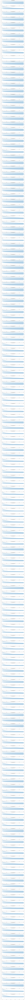

In [ ]:
# do khối lượng data lớn, kiểm tra một dataframe trong mẫu
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
def autoCorrelation(df):
    df_item = df[0]
    fig, ax = plt.subplots(df_item.shape[1], figsize=(12,150))
    for item in range(df_item.shape[1]):
        ax[item] = plot_acf(df_item.iloc[:, item].dropna(), ax=ax[item], lags=50)
    fig.show()

with PdfPages('figures/autocorrelation/autocorelation.pdf') as pdf:
    df_item = df[0]
    fig, ax = plt.subplots(df_item.shape[1], figsize=(12,500))
    for item in range(df_item.shape[1]):
        ax[item] = plot_acf(df_item.iloc[:, item].dropna(), ax=ax[item], lags=50)
    pdf.savefig()

Do các biểu đồ tự tương quan có hệ số tương quan tốt với các thời đoạn quá khứ: hơn 99% có ý nghĩa thống kế trong 10 thời đoạn ta có thể sử dụng n =10 là range sử dụng trong mô hình predict để fill missing data

## `2.` Correlation matrix

In [ ]:
# tính ma trận tương quan của df[0]
df_feature = df[0].drop(columns='Gia KL')

corr_matrix = df_feature.corr()
print(corr_matrix)
print('Tổng các cặp features là:', 180*180)

# Ngưỡng độ tương quan thấp
threshold = 0.3

# Đếm số cặp feature có độ tương quan thấp
low_correlation_count = np.sum(np.abs(corr_matrix) < threshold).sum()

print("Số cặp feature có độ tương quan thấp:", low_correlation_count)
print("Tỷ lệ các cặp feature có độ tương quan thấp:", low_correlation_count/(180*180))

In [ ]:
# df_old = pd.read_pickle(pkl_path)   là df cũ chưa clean

# tính ma trận tương quan của df_old[0]
df_feature_old = df_old[0].drop(columns='Gia KL')

corr_matrix_old = df_feature_old.corr()
print(corr_matrix_old)

print('Tổng các cặp features là:', 180*180)

# Ngưỡng độ tương quan thấp
threshold = 0.3

# Đếm số cặp feature có độ tương quan thấp
low_correlation_count_old = np.sum(np.abs(corr_matrix_old) < threshold).sum()

print("Số cặp feature có độ tương quan thấp:", low_correlation_count_old)
print("Tỷ lệ các cặp feature có độ tương quan thấp:", low_correlation_count_old/(180*180))

## `3.` Center Moving Average

In [ ]:
train = pd.read_csv(sheet_csv, header = 0, index_col=0)
index_table = train.columns

In [ ]:
def numberNanValues(value, dataframe, col, start, end):
    dem = 0
    for index in range(start, end):
        if dataframe[col][index] == value:
            dem +=1
    return dem

# fill missing data bằng dữ liệu trung bình dịch chuyển
# parsing list df
def centerMovingAverage(df):
    new_list_df = []
    for df_item in df:
        row, col = df_item.shape
        # parsing features
        for item in index_table.values:
            for index in range(row):
                if df_item[item][index] == 0:
                    if index >= 5 and index < row-5:
                        avg = sum(df_item[item][index2] for index2 in range(index-5, index+5))/(11- numberNanValues(0,df_item, item,index-5, index+5))
                    elif index <= 5 :
                        avg = sum(df_item[item][index2] for index2 in range(0, 10))/(11- numberNanValues(0,df_item, item,0, 10))
                    else:
                        avg = sum(df_item[item][index2] for index2 in range(row-10, row))/(11- numberNanValues(0,df_item, item,row-10, row))
                    df_item[item][index] = avg
        new_list_df.append(df_item)
    return new_list_df


df = centerMovingAverage(df)


* Dữ Liệu từ giai đoạn này đã được fill missing

In [ ]:
# saving data after apply MA
with open(new_pkl_path, "wb") as f:
    pickle.dump(df, f)

In [ ]:
df = pd.read_pickle(new_pkl_path)
with PdfPages('figures/boxplot/boxplot.pdf') as pdf:
    for df_unit in df:
        dims = list(df_unit.columns)
        # Vẽ biểu đồ bboxplot
        plt.figure(figsize=(16, 8))
        plt.boxplot([df_unit[col] for col in dims])
        plt.xlabel('Scale', fontsize=16)
        plt.ylabel('cm', fontsize=16)
        plt.xticks(np.arange(len(dims))+1, dims, rotation=45, fontsize=5)
        plt.title("Boxplot of Dimensions", fontsize=18)
        pdf.savefig()
    plt.close()

In [ ]:
df = pd.read_pickle(new_pkl_path)
df_clean = pd.DataFrame()
for item in df:
    df_clean= pd.concat([df_clean, item], ignore_index = True)
df_clean.to_csv(sheet_csv_clean)

In [ ]:
df_old = pd.read_pickle(pkl_path)
df_old[0].describe()

,mua_gia_1ACB,mua_gia_1BCM,mua_gia_1BID,mua_gia_1BVH,mua_gia_1CTG,mua_gia_1FPT,mua_gia_1GAS,mua_gia_1GVR,mua_gia_1HDB,mua_gia_1HPG,...,ban_kl_2TCB,ban_kl_2TPB,ban_kl_2VCB,ban_kl_2VHM,ban_kl_2VIB,ban_kl_2VIC,ban_kl_2VJC,ban_kl_2VNM,ban_kl_2VPB,ban_kl_2VRE
count,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,...,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000
mean,24.570588,78.791146,44.404526,46.761393,28.895221,79.403800,96.463961,15.458107,19.160784,20.912484,...,3127.853582,1030.714906,286.289683,329.182788,3827.000868,962.168403,46.396577,636.836310,8001.737973,807.891245
std,0.082900,0.155070,0.094668,0.225487,0.123306,0.070433,0.593490,0.086185,0.025317,0.032109,...,4671.477555,1740.346636,581.511494,579.293353,4689.442323,1184.533948,109.707275,1256.452793,5656.585312,1171.931114
min,24.400000,78.600000,44.200000,46.200000,28.650000,79.285714,95.100000,15.030000,19.100000,20.800000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,24.500000,78.700000,44.350000,46.650000,28.750000,79.400000,95.750000,15.400000,19.150000,20.900000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4030.000000,0.000000
50%,24.550000,78.700000,44.400000,46.800000,28.950000,79.400000,96.800000,15.500000,19.150000,20.900000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7150.000000,360.000000
75%,24.600000,78.900000,44.500000,46.950000,29.000000,79.500000,96.900000,15.500000,19.150000,20.950000,...,5830.000000,1500.000000,409.375000,500.000000,7620.000000,2150.000000,0.000000,600.000000,11540.000000,1330.000000
max,24.750000,79.300000,44.700000,47.050000,29.100000,79.500000,97.500000,15.600000,19.250000,21.000000,...,17830.000000,9450.000000,3340.000000,2720.000000,18720.000000,3890.000000,510.000000,5620.000000,33260.000000,7430.000000


In [ ]:
df = pd.read_pickle(new_pkl_path)
df[0].describe()

,mua_gia_1ACB,mua_gia_1BCM,mua_gia_1BID,mua_gia_1BVH,mua_gia_1CTG,mua_gia_1FPT,mua_gia_1GAS,mua_gia_1GVR,mua_gia_1HDB,mua_gia_1HPG,...,ban_kl_2TCB,ban_kl_2TPB,ban_kl_2VCB,ban_kl_2VHM,ban_kl_2VIB,ban_kl_2VIC,ban_kl_2VJC,ban_kl_2VNM,ban_kl_2VPB,ban_kl_2VRE
count,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,...,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000
mean,24.570588,78.791146,44.404526,46.761393,28.895221,79.403800,96.463961,15.458107,19.160784,20.912484,...,5056.369985,2010.978830,697.805628,731.937376,6936.486794,1900.853960,143.312978,1158.347850,9094.842839,1255.447654
std,0.082900,0.155070,0.094668,0.225487,0.123306,0.070433,0.593490,0.086185,0.025317,0.032109,...,4328.122083,1621.768603,606.312235,524.397296,3198.675441,620.384289,100.641230,1333.895737,4871.193807,1050.579547
min,24.400000,78.600000,44.200000,46.200000,28.650000,79.285714,95.100000,15.030000,19.100000,20.800000,...,95.000000,10.000000,6.150437,2.112741,30.000000,504.355000,4.818655,30.000000,20.000000,135.428571
25%,24.500000,78.700000,44.350000,46.650000,28.750000,79.400000,95.750000,15.400000,19.150000,20.900000,...,1567.187314,719.424968,274.277680,364.911008,4687.108844,1499.212240,70.949466,443.459434,5810.000000,490.000000
50%,24.550000,78.700000,44.400000,46.800000,28.950000,79.400000,96.800000,15.500000,19.150000,20.900000,...,3406.081275,1460.000000,620.000000,631.168717,6430.000000,1819.777233,120.609845,570.000000,8345.873016,1010.000000
75%,24.600000,78.900000,44.500000,46.950000,29.000000,79.500000,96.900000,15.500000,19.150000,20.950000,...,7350.000000,3344.910714,920.000000,1000.000000,8470.416667,2279.897139,188.807802,1187.642876,11780.000000,1693.190610
max,24.750000,79.300000,44.700000,47.050000,29.100000,79.500000,97.500000,15.600000,19.250000,21.000000,...,17830.000000,9450.000000,3340.000000,2720.000000,18720.000000,3890.000000,510.000000,5620.000000,33260.000000,7430.000000


/var/folders/_x/886sy6k57y90dfy4fjklx08r0000gn/T/ipykernel_73215/440953869.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(16, 8))


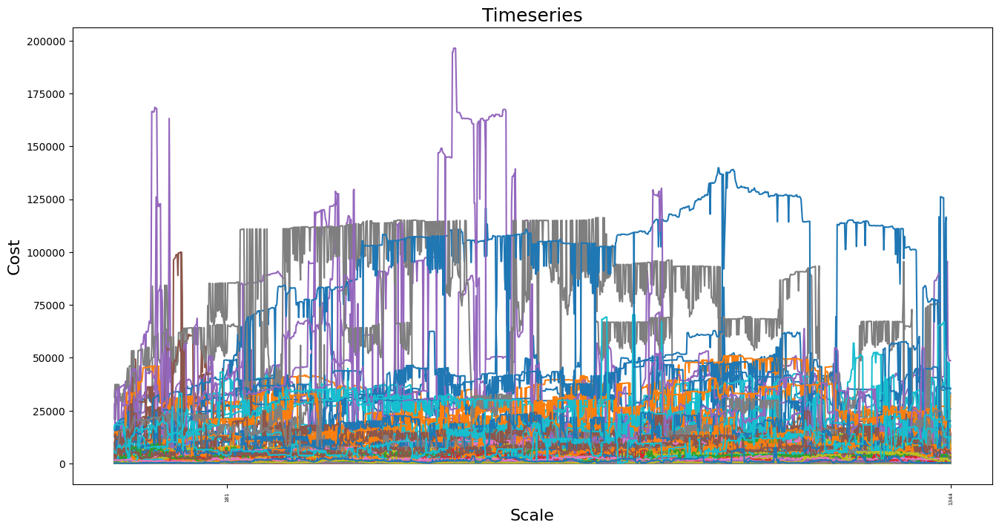

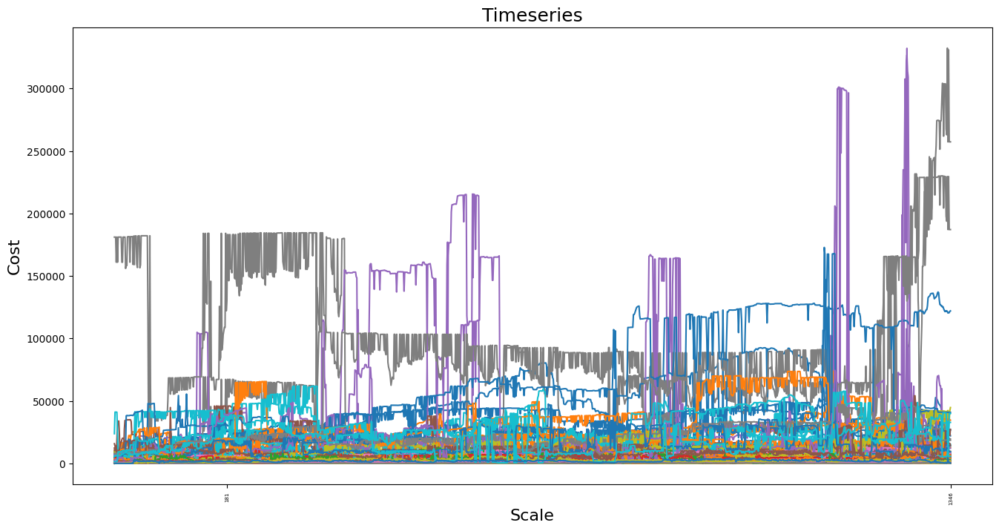

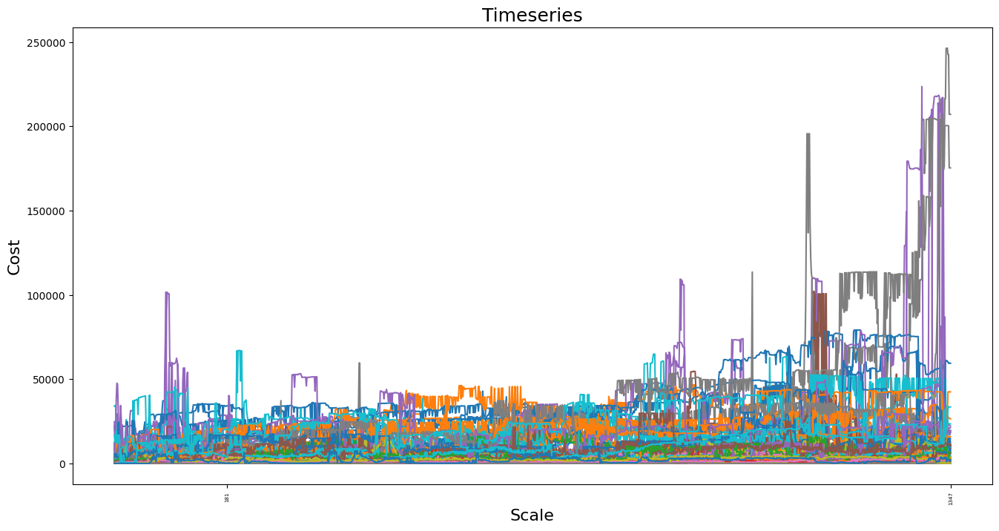

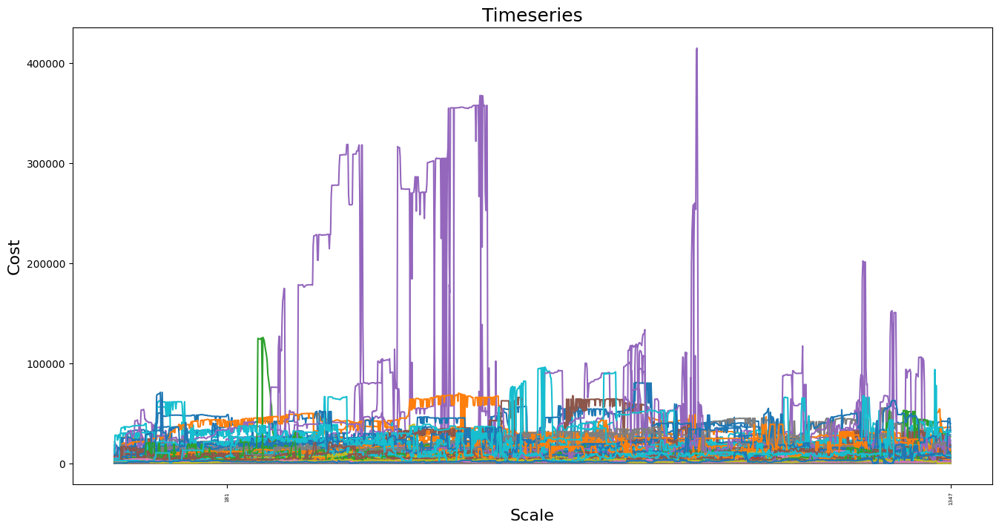

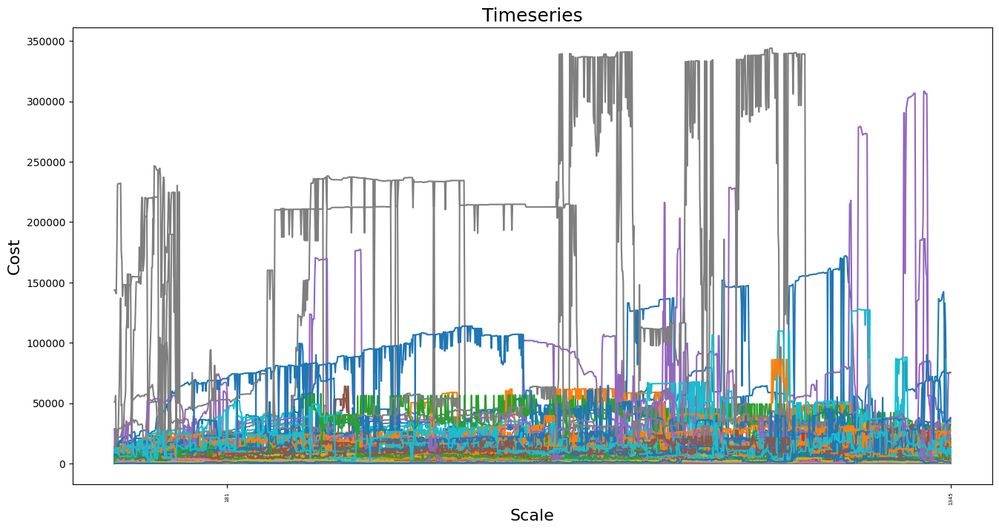

...

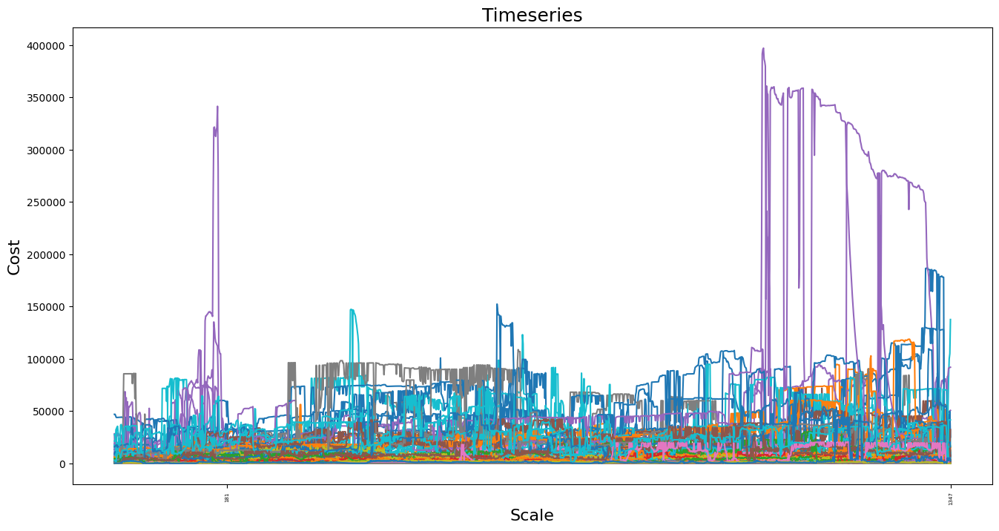

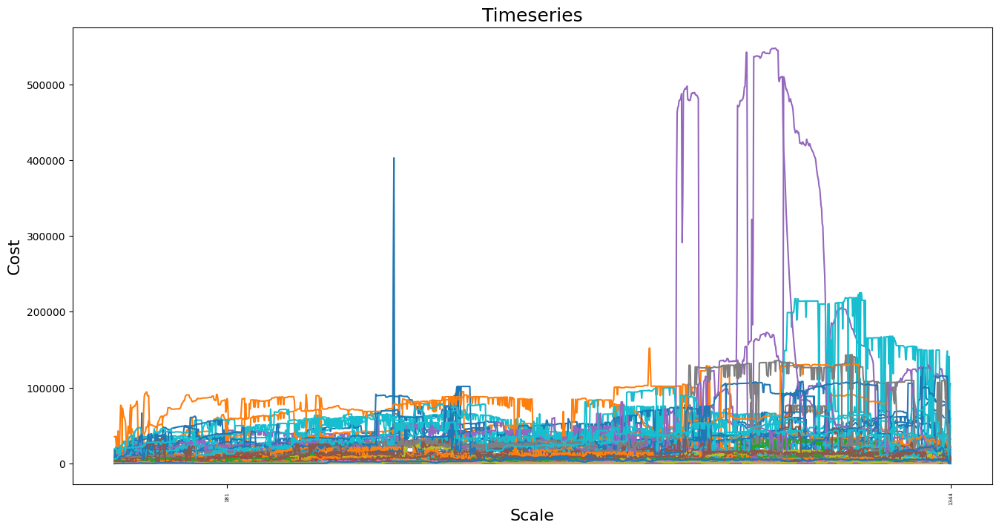

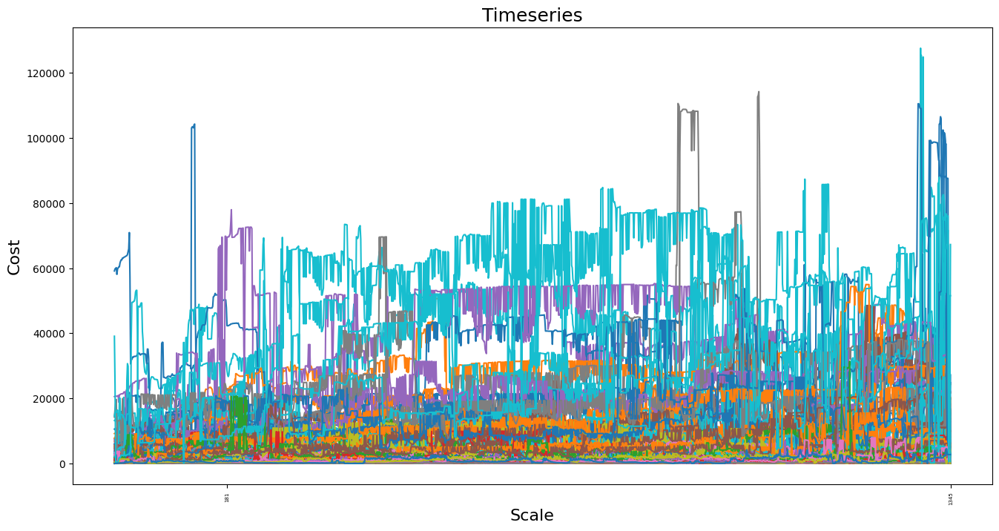

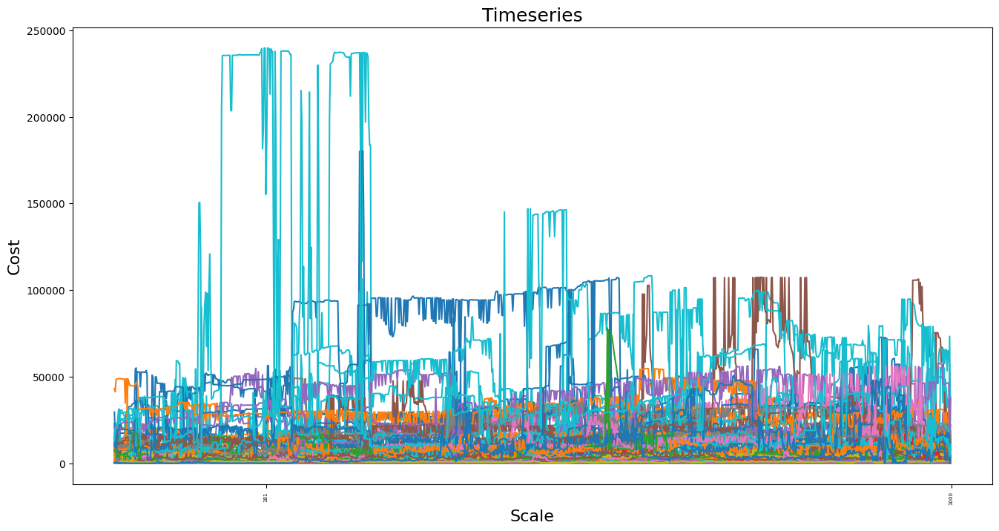

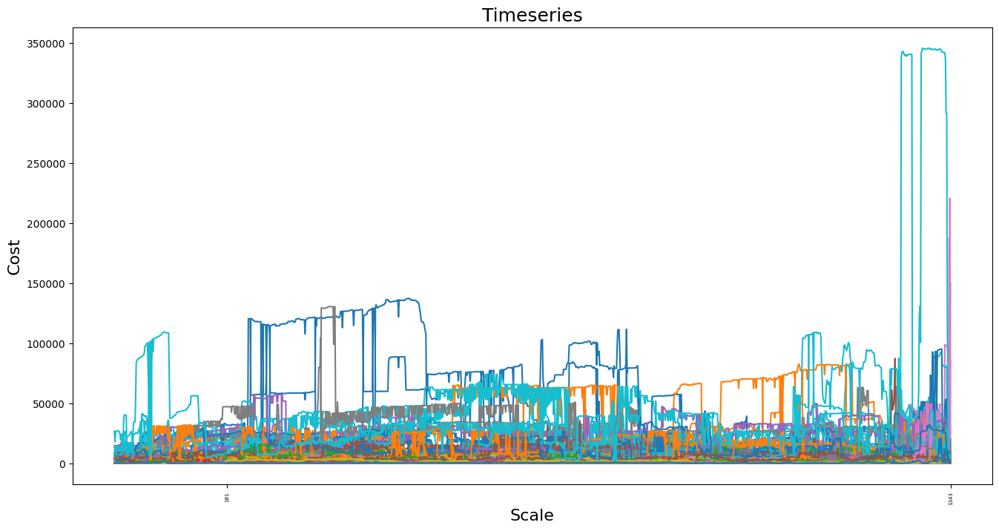

In [ ]:
df = pd.read_pickle(new_pkl_path)
with PdfPages('figures/plot/plot.pdf') as pdf:
    for df_unit in df:
        dims = list(df_unit.columns)
        # Vẽ biểu đồ bboxplot
        plt.figure(figsize=(16, 8))
        for col in dims:
            plt.plot([x for x in range(0, df_unit.shape[0])], df_unit[col])
        plt.xlabel('Scale', fontsize=16)
        plt.ylabel('Cost', fontsize=16)
        plt.xticks(df_unit.shape, rotation=90, fontsize=5)
        plt.title("Timeseries", fontsize=18)
        pdf.savefig()
    plt.close()

# PCA

# Cluster